## NOME: MARCELO ADRIEL MORESCO

In [ ]:
!pip install kaggle
!pip install tensorflow
!pip install tensorflowjs


INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 97.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 39.8 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully unin

In [1]:
from google.colab import files
files.upload() # kaggle.json

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d haroonalam16/20-skin-diseases-dataset

import zipfile
import os

with zipfile.ZipFile('20-skin-diseases-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('skin_diseases')



Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/haroonalam16/20-skin-diseases-dataset
License(s): other
100% 321M/321M [00:03<00:00, 116MB/s]
100% 321M/321M [00:03<00:00, 94.5MB/s]


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Flatten, Dense, Dropout,
                                     BatchNormalization, Rescaling)
from tensorflow.keras.models import Sequential
from keras._tf_keras.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint



In [65]:
# teste e train
train_dir = '/content/skin_diseases/Dataset/train'
test_dir = '/content/skin_diseases/Dataset/test'


train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical')

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    "/content/skin_diseases/Dataset",
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical')

path = "/content/skin_diseases/Dataset/train/"
class_names = sorted(os.listdir(path))
num_classes = len(class_names)

img_size = (192, 192, 3)

print('classes: ', class_names)



Found 2609 images belonging to 19 classes.
Found 3506 images belonging to 2 classes.
classes:  ['Acne and Rosacea Photos', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Atopic Dermatitis Photos', 'Cellulitis Impetigo and other Bacterial Infections', 'Eczema Photos', 'Exanthems and Drug Eruptions', 'Herpes HPV and other STDs Photos', 'Light Diseases and Disorders of Pigmentation', 'Lupus and other Connective Tissue diseases', 'Melanoma Skin Cancer Nevi and Moles', 'Poison Ivy Photos and other Contact Dermatitis', 'Psoriasis pictures Lichen Planus and related diseases', 'Seborrheic Keratoses and other Benign Tumors', 'Systemic Disease', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Urticaria Hives', 'Vascular Tumors', 'Vasculitis Photos', 'Warts Molluscum and other Viral Infections']


In [67]:
import cv2
import numpy as np
import os

# processar uma única imagem -  bgr para rgb
def process_image(image_path, img_size):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise ValueError(f"Erro ao carregar a imagem: {image_path}")
    image = cv2.resize(image, img_size[:2])  # Redimensionar para o tamanho desejado
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Converter de BGR para RGB
    return np.asarray(image)

# processar todas as imagens de uma classe
def process_class_images(class_name, class_index, num_classes, path, img_size):
    class_images = []
    class_labels = []
    class_path = os.path.join(path, class_name)

    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        # rótulo one-hot
        label = np.eye(num_classes)[class_index]
        class_labels.append(label)

        # processar imagem
        image = process_image(img_path, img_size)
        class_images.append(image)

    return class_images, class_labels

#  processar todas as classes
def process_dataset(class_names, path, img_size):
    all_images = []
    all_labels = []

    print("Processing images:\n")
    for class_index, class_name in enumerate(class_names):
        print(f"{class_name} -> ", end="")

        class_images, class_labels = process_class_images(
            class_name, class_index, len(class_names), path, img_size
        )

        all_images.extend(class_images)
        all_labels.extend(class_labels)
        print("done")

    return np.asarray(all_images), np.asarray(all_labels)

images, labels = process_dataset(class_names, path, img_size)

# Verificar shapes
print(f"\n\nLabels shape: {labels.shape}")
print(f"Images shape: {images.shape}")


Processing images:

Acne and Rosacea Photos -> done
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions -> done
Atopic Dermatitis Photos -> done
Cellulitis Impetigo and other Bacterial Infections -> done
Eczema Photos -> done
Exanthems and Drug Eruptions -> done
Herpes HPV and other STDs Photos -> done
Light Diseases and Disorders of Pigmentation -> done
Lupus and other Connective Tissue diseases -> done
Melanoma Skin Cancer Nevi and Moles -> done
Poison Ivy Photos and other Contact Dermatitis -> done
Psoriasis pictures Lichen Planus and related diseases -> done
Seborrheic Keratoses and other Benign Tumors -> done
Systemic Disease -> done
Tinea Ringworm Candidiasis and other Fungal Infections -> done
Urticaria Hives -> done
Vascular Tumors -> done
Vasculitis Photos -> done
Warts Molluscum and other Viral Infections -> done


Labels shape: (2609, 19)
Images shape: (2609, 192, 192, 3)


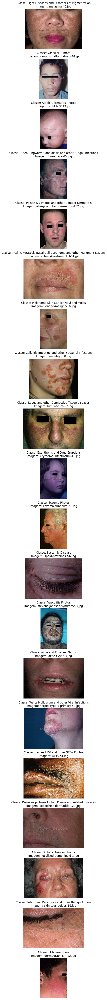

In [61]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

test_dir = '/content/skin_diseases/Dataset/test'

classes = [d for d in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, d))]

fig, axs = plt.subplots(len(classes), 1, figsize=(10, len(classes) * 3))
for i, cls in enumerate(classes):
    class_dir = os.path.join(test_dir, cls)
    images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

    random_image = random.choice(images)
    image_path = os.path.join(class_dir, random_image)

    img = Image.open(image_path)
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(f"Classe: {cls}\nImagem: {random_image}")

plt.tight_layout()
plt.show()


In [86]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

print(f'X_TRAIN shape: {X_train.shape}')
print(f'Y_TRAIN shape: {y_train.shape}')
print(f'X_VAL shape: {X_val.shape}')
print(f'Y_VAL shape: {y_val.shape}')


X_TRAIN shape: (2087, 192, 192, 3)
Y_TRAIN shape: (2087, 19)
X_VAL shape: (522, 192, 192, 3)
Y_VAL shape: (522, 19)


In [87]:
derma_check_model = tf.keras.Sequential()

# entrada e pre processamento
derma_check_model.add(tf.keras.layers.Rescaling(scale=1. / 255, input_shape=(img_size)))

# camada 1
derma_check_model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.MaxPooling2D(pool_size=2))

# camada 2
derma_check_model.add(tf.keras.layers.Conv2D(128, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.Conv2D(128, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.MaxPooling2D(pool_size=2))

# camada 3
derma_check_model.add(tf.keras.layers.Conv2D(256, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.Conv2D(256, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.MaxPooling2D(pool_size=2))

# camada 4
derma_check_model.add(tf.keras.layers.Conv2D(512, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.Conv2D(512, (2, 2), activation='relu', padding='same'))
derma_check_model.add(tf.keras.layers.MaxPooling2D(pool_size=2))
derma_check_model.add(tf.keras.layers.Flatten())

# bloco denso
derma_check_model.add(tf.keras.layers.Dense(256, activation='relu'))
derma_check_model.add(tf.keras.layers.Dense(128, activation='relu'))
derma_check_model.add(tf.keras.layers.Dense(64, activation='relu'))
derma_check_model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))


derma_check_model.compile(optimizer='Adamax', loss='categorical_crossentropy', metrics=['accuracy'])

derma_check_model.summary()



Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_20 (Rescaling)             │ (None, 192, 192, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_160 (Conv2D)                  │ (None, 192, 192, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_161 (Conv2D)                  │ (None, 192, 192, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_80 (MaxPooling2D)      │ (None, 96, 96, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_162 (Conv2D)                  │ (None, 96, 96, 128)         │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_163 (Conv2D)                  │ (None, 96, 96, 128)         │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_81 (MaxPooling2D)      │ (None, 48, 48, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_164 (Conv2D)                  │ (None, 48, 48, 256)         │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_165 (Conv2D)                  │ (None, 48, 48, 256)         │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_82 (MaxPooling2D)      │ (None, 24, 24, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_166 (Conv2D)                  │ (None, 24, 24, 512)         │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_167 (Conv2D)                  │ (None, 24, 24, 512)         │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_83 (MaxPooling2D)      │ (None, 12, 12, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_20 (Flatten)                 │ (None, 73728)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_77 (Dense)                     │ (None, 256)                 │      18,874,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_78 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_79 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_80 (Dense)                     │ (None, 19)                  │           1,235 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,021,907 (80.19 MB)

 Trainable params: 21,021,907 (80.19 MB)

 Non-trainable params: 0 (0.00 B)

In [88]:
history = derma_check_model.fit(images, labels, epochs=18, validation_data=(X_val, y_val))


Epoch 1/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 26s 268ms/step - accuracy: 0.2204 - loss: 2.6543 - val_accuracy: 0.3372 - val_loss: 2.3648
Epoch 2/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - accuracy: 0.3247 - loss: 2.3395 - val_accuracy: 0.3429 - val_loss: 2.2926
Epoch 3/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - accuracy: 0.3291 - loss: 2.2859 - val_accuracy: 0.3621 - val_loss: 2.1887
Epoch 4/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - accuracy: 0.3278 - loss: 2.2374 - val_accuracy: 0.3697 - val_loss: 2.1572
Epoch 5/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - accuracy: 0.3355 - loss: 2.2002 - val_accuracy: 0.3946 - val_loss: 2.1195
Epoch 6/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - accuracy: 0.3626 - loss: 2.1549 - val_accuracy: 0.3889 - val_loss: 2.0057
Epoch 7/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - accuracy: 0.3755 - loss: 2.0562 - val_accuracy: 0.4540 - val_loss: 1.8018
Epoch 8/18
82/82 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - accuracy: 0.4142 - loss: 1.8734 - val_accu

In [89]:
derma_check_model.save("model_derma_check__1_oficial.h5")

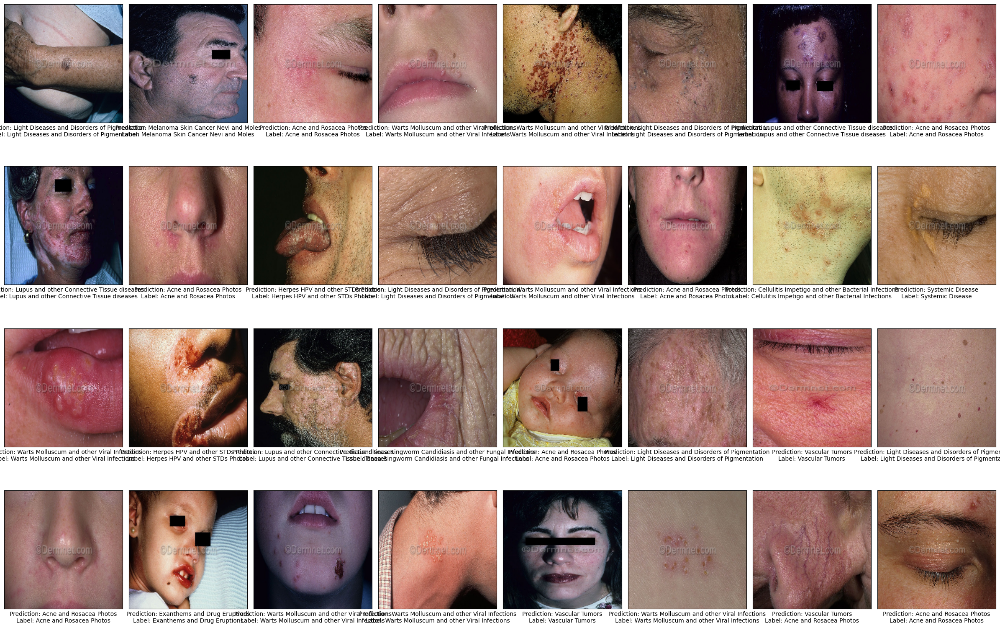

In [90]:
fig, axs = plt.subplots(4, 8, figsize=(24, 16))

i = 0
for x in range(4):
    for y in range(8):
        prediction = derma_check_model.predict(X_val[i][None, ...], verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(
            f'Prediction: {class_names[np.argmax(prediction)]}\nLabel: {class_names[np.argmax(y_val[i])]}',
            fontsize=10
        )
        axs[x][y].imshow(X_val[i])

        i += 1

plt.tight_layout()
plt.show()


In [92]:
saved_model_path = '/content/model_derma_check'
tf.saved_model.save(derma_check_model, saved_model_path)


In [101]:
!pip install tensorflowjs

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 107.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 115.0 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully un

In [102]:
!tensorflowjs_converter --input_format=tf_saved_model --output_format=tfjs_graph_model /content/model_derma_check /content/graph_model_derma

2024-12-08 22:32:52.639175: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733697172.661246   21318 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733697172.668177   21318 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2024-12-08 22:32:57.198961: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1733697177.199131   21318 gpu_device.cc:2022] Created device /job:localhost/replica:0/task

In [103]:
import shutil

folder_path = "/content/graph_model_derma"
zip_path = "/content/graph_model_derma.zip"

shutil.make_archive(zip_path.replace(".zip", ""), 'zip', folder_path)

print(f"Modelo compactado em: {zip_path}")


Modelo compactado em: /content/graph_model_derma.zip


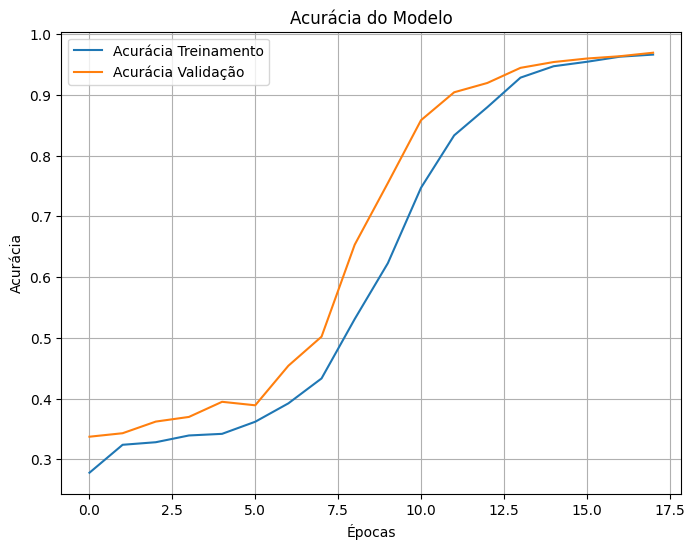

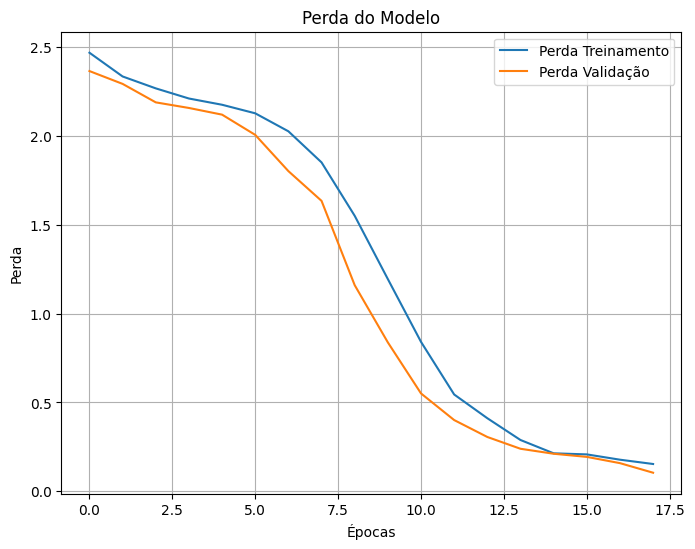

In [95]:

plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Acurácia Treinamento')
plt.plot(history.history['val_accuracy'], label='Acurácia Validação')
plt.title('Acurácia do Modelo')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
plt.grid()
plt.show()

# Plotando Loss
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Perda Treinamento')
plt.plot(history.history['val_loss'], label='Perda Validação')
plt.title('Perda do Modelo')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()
plt.grid()
plt.show()
